<a href="https://colab.research.google.com/github/sudheerpunuri82/Facial-Emotion-Recognition-FER-using-Transfer-Learning/blob/main/Efficientnet_xgboost_kdefconfusionmatrix.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#cnn with xgboost
import numpy as np
np.random.seed(1337)  # for reproducibility
import tensorflow as tf
from keras.datasets import mnist
from keras.utils import np_utils
from keras.models import Sequential, Model
from keras.layers import Dense, Activation, Convolution2D, MaxPooling2D, Flatten, Input, Dropout
from tensorflow.keras.optimizers import Adam
import pandas as pd
import matplotlib.pyplot as plt


ImportError: cannot import name 'np_utils' from 'keras.utils' (/usr/local/lib/python3.10/dist-packages/keras/utils/__init__.py)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/kdef_pixels.csv')
df.head()

,emotion,pixels,Usage
0,0,134 134 133 132 131 132 135 132 136 131 132 13...,Training
1,0,134 137 131 135 132 133 135 136 139 134 135 13...,Training
2,0,132 132 132 134 133 130 131 138 133 132 131 13...,Training
3,0,131 131 130 130 132 134 133 130 129 128 126 13...,Training
4,0,144 145 145 144 145 144 144 145 144 142 144 14...,Training


In [ ]:
df.shape

(490, 3)

In [ ]:
df.emotion.unique()


array([0, 1, 2, 3, 4, 5, 6])

In [ ]:
# label_to_text = {0: 'anger', 1: 'disgust', 2: 'fear', 3:'happines', 4: 'sadness', 5:'surprise', 6: 'neutral'}
label_to_text = {0: 'Afraid', 1: 'Angry', 2: 'Disgusted', 3:'Happy', 4: 'Neutral', 5:'Sad', 6: 'Surprised'}
# classes = ['Afraid', 'Angry', 'Disgusted', 'Happy', 'Neutral', 'Sad', 'Surprised

In [ ]:
np.array(df.pixels.loc[0].split(' ')).reshape(256,256,1).astype('float32')

array([[[134.],
        [134.],
        [133.],
        ...,
        [133.],
        [136.],
        [137.]],

       [[134.],
        [135.],
        [134.],
        ...,
        [132.],
        [135.],
        [134.]],

       [[132.],
        [133.],
        [133.],
        ...,
        [132.],
        [134.],
        [132.]],

       ...,

       [[114.],
        [114.],
        [113.],
        ...,
        [ 24.],
        [ 25.],
        [ 29.]],

       [[112.],
        [110.],
        [110.],
        ...,
        [ 23.],
        [ 28.],
        [ 33.]],

       [[114.],
        [110.],
        [110.],
        ...,
        [ 26.],
        [ 31.],
        [ 33.]]], dtype=float32)

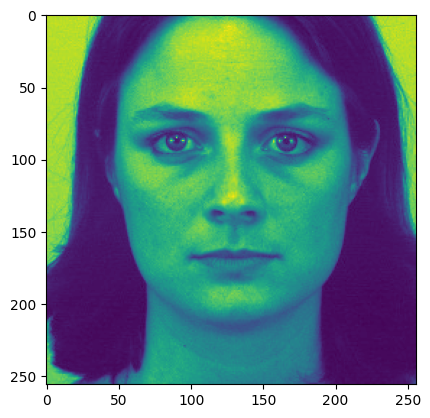

In [ ]:
plt.imshow(np.array(df.pixels.loc[0].split(' ')).reshape(256,256).astype('float32'))

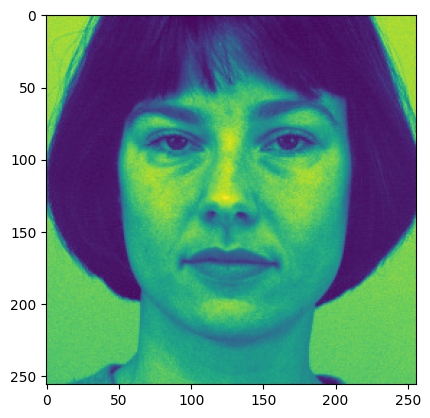

In [ ]:
import matplotlib.pyplot as plt

plt.imshow(np.array(df.pixels.loc[50].split(' ')).reshape(256,256).astype('float32'))


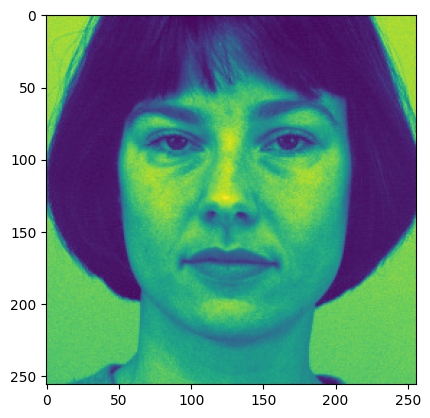

In [ ]:
plt.imshow(np.array(df.pixels.loc[50].split(' ')).reshape(256,256).astype('float32'))

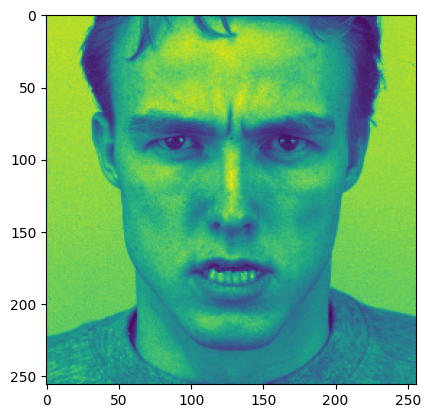

In [ ]:
plt.imshow(np.array(df.pixels.loc[100].split(' ')).reshape(256,256).astype('float32'))

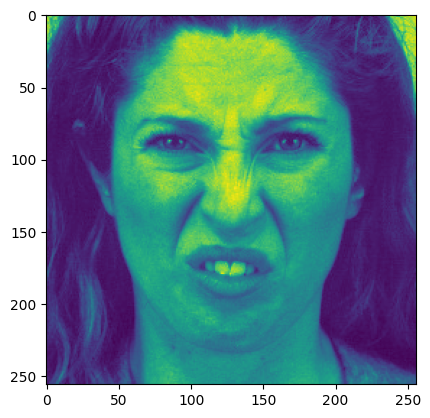

In [ ]:
plt.imshow(np.array(df.pixels.loc[150].split(' ')).reshape(256,256).astype('float32'))

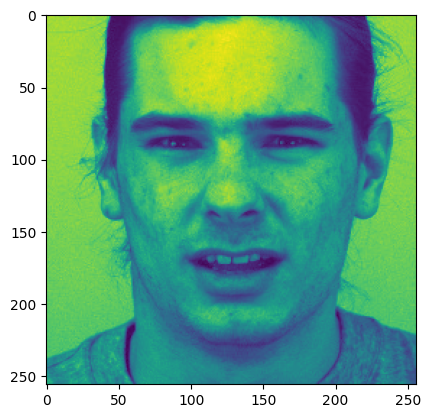

In [ ]:
plt.imshow(np.array(df.pixels.loc[220].split(' ')).reshape(256,256).astype('float32'))

AxesImage(size=(256, 256))


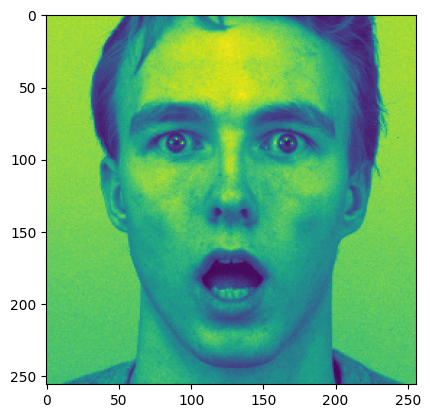

In [ ]:
a = plt.imshow(np.array(df.pixels.loc[450].split(' ')).reshape(256,256).astype('float32'))
print(a)

In [ ]:
img_array = df.pixels.apply(lambda x: np.array(x.split(' ')).reshape(256,256,1).astype('float32'))


In [ ]:
img_array = np.stack(img_array, axis =0)

img_array.shape

(490, 256, 256, 1)

In [ ]:
img_array = np.repeat(img_array, 3, -1)
img_array.shape

(490, 256, 256, 3)

In [ ]:
labels = df.emotion.values
print(len(labels))


490


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test= train_test_split(img_array, labels,test_size=0.2,shuffle=True)

In [ ]:
print(y_train.shape)
print(y_test.shape)
print(y_train.shape)

print(X_train.shape)
print(X_test.shape)

(392,)
(98,)
(392,)
(392, 256, 256, 3)
(98, 256, 256, 3)


In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=.1)
print(X_val.shape, y_val.shape)
Y_train = np_utils.to_categorical(y_train, 7)
Y_val = np_utils.to_categorical(y_val, num_classes=7)
print(X_val.shape, Y_val.shape)
X_val = X_val/255.0

(40, 256, 256, 3) (40,)
(40, 256, 256, 3) (40, 7)


In [ ]:
# X_train = X_train.reshape(-1, 1,28, 28)/255.
# X_test = X_test.reshape(-1, 1,28, 28)/255.
X_train = X_train/255.
X_test = X_test/255.
Y_train = np_utils.to_categorical(y_train, num_classes=7)
Y_test = np_utils.to_categorical(y_test, num_classes=7)
# # print(Y_train[:1])
print(X_train.shape)
print(Y_train.shape)
Y_val = np_utils.to_categorical(y_val, 7)
X_val = X_val/255.0

(352, 256, 256, 3)
(352, 7)


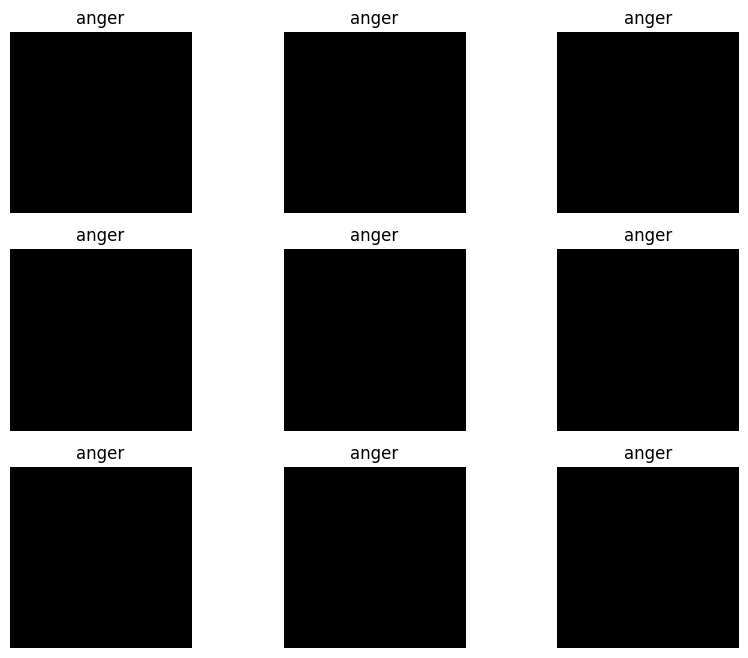

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# Map the emotion-categories
mapping = {0:'anger', 1:'disgust', 2:'fear', 3:'happy', 4:'sadness', 5:'surprise'}

# Initialize the training data augmentation object
trainAug = ImageDataGenerator(rotation_range=15,
                              zoom_range=0.15,
                              #width_shift_range=0.2,
                              brightness_range=(.6, 1.2),
                              shear_range=.15,
                              #height_shift_range=0.2,
                              horizontal_flip=True,
                              fill_mode="nearest")

# Randomly vizualize some augmented samples
plt.figure(figsize=(10,8))
for i, (image, label) in enumerate(trainAug.flow(X_val, y_val, batch_size=1)):
    if i == 9:
        break
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(np.squeeze(image)/255.)
    plt.title(mapping[np.argmax(label)])
    plt.axis("off")

In [ ]:
inputs = Input(shape=(256,256,3))


from tensorflow.keras.applications import EfficientNetB0,EfficientNetB6
from tensorflow.keras.layers import Dropout, Dense, Input, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
base_model = EfficientNetB6(include_top=False, weights='imagenet',
                                drop_connect_rate=0.33, input_tensor=inputs)
x = GlobalAveragePooling2D()(base_model.output)
x = Dropout(.35, name="top_dropout")(x)
x = Dense(1024, activation='relu')(x)

outputs = Dense(7, activation='softmax')(x)

model_dense2_output = Model(inputs = inputs, outputs = x)
model = Model(inputs=inputs , outputs = outputs)
model = Model(inputs, outputs)


165234480/165234480 [==============================] - 1s 0us/step


In [ ]:
from tensorflow.keras.optimizers import SGD
lr = 1e-4
adam = Adam(lr=1e-4, beta_1=0.9, beta_2=0.999, epsilon = 1e-7)
sgd = SGD(learning_rate = lr, momentum =.9, nesterov=False)



In [ ]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 256, 256, 3)  0           ['input_1[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 256, 256, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 rescaling_1 (Rescaling)        (None, 256, 256, 3)  0           ['normalization[0][0]']    

In [ ]:
model.compile(optimizer=adam,loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.callbacks import ReduceLROnPlateau
batch_size = 32
EPOCHS = 100
reduce_lr = ReduceLROnPlateau(monitor='accuracy', factor=0.1, patience=10,
                             verbose=0, mode='auto', min_delta=0.0001,
                               cooldown=0, min_lr=0)
print('Training ------------')
# Another way to train the model
filepath = '/content/sample_data/'
# Define the necessary callbacks
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
earlystopping = EarlyStopping(monitor='val_accuracy', patience=15, verbose=1, mode='auto', restore_best_weights=True)
rlrop = ReduceLROnPlateau(monitor='val_accuracy', mode='max', patience=5, factor=0.5, min_lr=1e-6, verbose=1)

callbacks = [checkpoint,  rlrop]

# print(f"[INFO] training network for {EPOCHS} epochs...\n")
# hist = model.fit(trainAug.flow(X_train, y_train, batch_size=batch_size),
#                  steps_per_epoch=len(X_train) // batch_size,
#                  validation_data=(X_val, y_val),
#                  epochs=EPOCHS, callbacks=callbacks)

# lrr = ReduceROnPlateau(monitor='val_acc', factor = .01, patience = 3, min_lr=1e-5)
# model.fit(X_train, Y_train, batch_size = batch_size, epochs = 10, steps_per_epoch = X_train[0]//batch_size, callbacks =[reduce_lr])

hist=model.fit(X_train, Y_train, epochs=150, batch_size=16, validation_data = (X_val, Y_val), callbacks=[reduce_lr],verbose = 1)

Training ------------
Epoch 1/150
22/22 [==============================] - 164s 1s/step - loss: 1.5359 - accuracy: 0.4233 - val_loss: 2.3310 - val_accuracy: 0.1500 - lr: 0.0010
Epoch 2/150
22/22 [==============================] - 17s 767ms/step - loss: 0.9404 - accuracy: 0.7330 - val_loss: 2.4680 - val_accuracy: 0.1500 - lr: 0.0010
Epoch 3/150
22/22 [==============================] - 17s 778ms/step - loss: 0.6469 - accuracy: 0.7898 - val_loss: 2.9216 - val_accuracy: 0.1500 - lr: 0.0010
Epoch 4/150
22/22 [==============================] - 17s 796ms/step - loss: 0.7020 - accuracy: 0.7955 - val_loss: 2.2017 - val_accuracy: 0.1250 - lr: 0.0010
Epoch 5/150
22/22 [==============================] - 17s 779ms/step - loss: 0.5949 - accuracy: 0.8125 - val_loss: 3.0499 - val_accuracy: 0.2000 - lr: 0.0010
Epoch 6/150
22/22 [==============================] - 17s 777ms/step - loss: 0.3490 - accuracy: 0.8835 - val_loss: 3.7431 - val_accuracy: 0.2000 - lr: 0.0010
Epoch 7/150
22/22 [===================

In [ ]:
tf.saved_model.save(model, "saved_model")

In [ ]:
from keras.models import save_model

# Assuming you have trained your model and stored it in the 'model' variable

model.save("saved_model.h5")  # Save the entire model including architecture, weights, and optimizer state


TypeError: ignored

In [ ]:
from keras.models import load_model

loaded_model = load_model("saved_model.h5")  # Load the entire model from the saved file


In [ ]:
# Assuming you have your test data in X_test and Y_test

# Evaluate the loaded model on the test data
loss, accuracy = loaded_model.evaluate(X_test, Y_test)

print("Test Loss:", loss)
print("Test Accuracy:", accuracy)


NameError: ignored

In [ ]:
Y_test = np_utils.to_categorical(y_test, num_classes=7)


In [ ]:
intmod = Model(inputs=model.input,outputs=model.layers[0].output)
out=intmod.predict(a)




ValueError: ignored

In [ ]:
print('\nTesting ------------')
# Evaluate the model with the metrics we defined earlier
loss, accuracy = model.evaluate(X_test, Y_test, verbose = 1)


Testing ------------
4/4 [==============================] - 3s 492ms/step - loss: 0.5806 - accuracy: 0.8980


In [ ]:
# model.load_weights(checkpoint_path)
model.save_weights('/content/sample_data/kdef.hdf5')
model.save('content/sample_data/kdefmodel.hdf5')

TypeError: ignored

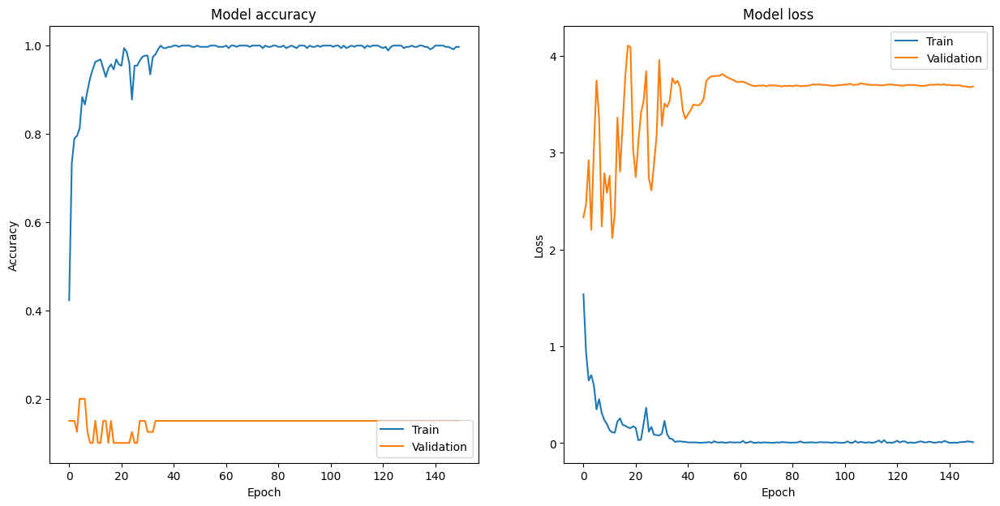

In [ ]:
# Clear the values of previous plot
%matplotlib inline
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(15, 7))

# Plot training & validation accuracy values
fig.add_subplot(121)
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.savefig('Training & Validation Accuracy Plot')

# Plot training & validation loss values
fig.add_subplot(122)
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.savefig('Training & Validation Loss Plot')
plt.savefig('/content/sample_data/efficientnetck.jpg')

In [ ]:
predicted_classes = model.predict(X_test)

4/4 [==============================] - 6s 298ms/step


In [ ]:
predicted_classes = np.argmax(np.round(predicted_classes), axis = 1)

In [ ]:
predicted_classes.shape, Y_test.shape

((98,), (98, 7))

In [ ]:
score = model.evaluate(X_test, Y_test)
Pred=model.predict(X_test)

Pred

4/4 [==============================] - 1s 293ms/step


array([[5.91063372e-06, 7.24773983e-08, 5.46099734e-08, 1.17628471e-04,
        2.20209972e-06, 1.14800187e-08, 9.99873996e-01],
       [1.52922821e-05, 4.32374776e-08, 1.28054935e-05, 1.75631794e-05,
        2.34420683e-09, 9.99954343e-01, 3.21324691e-08],
       [1.29358625e-04, 1.15087732e-06, 3.95496085e-04, 3.36189783e-04,
        2.21332030e-07, 9.99136269e-01, 1.33120659e-06],
       [9.99999881e-01, 3.66191966e-10, 2.58366575e-11, 5.37600624e-11,
        3.84278243e-12, 3.21401856e-08, 8.55012772e-08],
       [9.99994636e-01, 8.61232721e-08, 5.46940981e-09, 1.87797440e-08,
        1.36408451e-09, 4.31203807e-06, 8.90182207e-07],
       [1.04097846e-04, 9.99778807e-01, 1.08805056e-04, 2.10133840e-06,
        1.82918090e-08, 6.14153532e-06, 3.65875219e-09],
       [3.13321325e-05, 5.48061507e-07, 1.39473877e-05, 2.12044033e-05,
        9.99808729e-01, 7.33155248e-05, 5.10282298e-05],
       [9.18711958e-05, 1.05673234e-06, 5.66996869e-06, 3.35179328e-04,
        2.05319284e-05, 4

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
i=0
Y_test_l=[]
Pred_l=[]
while(i<len(Pred)):
  Y_test_l.append(int(np.argmax(Y_test[i])))
  Pred_l.append(int(np.argmax(Pred[i])))
  i+=1

report=classification_report(Y_test_l, Pred_l)
print(report)

              precision    recall  f1-score   support

           0       0.88      0.93      0.90        15
           1       1.00      0.75      0.86        12
           2       0.73      1.00      0.85        11
           3       0.80      0.89      0.84         9
           4       1.00      1.00      1.00        19
           5       1.00      0.81      0.89        21
           6       0.83      0.91      0.87        11

    accuracy                           0.90        98
   macro avg       0.89      0.90      0.89        98
weighted avg       0.91      0.90      0.90        98



EFFICIENTNET KDEF


ValueError: ignored

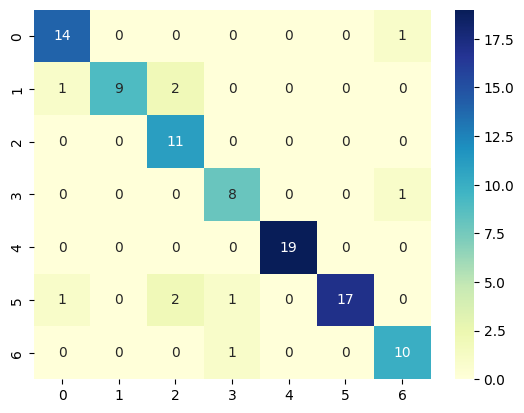

In [ ]:
label_to_text = {'Afraid','Angry', 'Disgusted','Happy', 'Neutral', 'Sad', 'Surprised'}

results = confusion_matrix(Y_test_l, Pred_l, )
import seaborn as sns

sns.heatmap(results, annot=True, cmap="YlGnBu")
print("EFFICIENTNET KDEF")


#Transform to df for easier plotting
cm_df = pd.DataFrame(results, index = label_to_text,
                     columns = label_to_text
                    )

In [ ]:
print('test loss: ', loss)
print('test accuracy: ', accuracy)
final_cm = cm_df
print(final_cm)



test loss:  0.5806252956390381
test accuracy:  0.8979591727256775


NameError: ignored

In [ ]:
plt.figure(figsize = (5,5))
sns.heatmap(final_cm, annot = True,cmap='Greens',linewidth=2,fmt='d')
plt.ylabel('True class')
plt.xlabel('Prediction class')
plt.show()
plt.savefig('cm_ekdef1.jpg')

NameError: ignored

<Figure size 500x500 with 0 Axes>

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

i=0
Y_test_l=[]
Pred_l=[]
while(i<len(Pred)):
  Y_test_l.append(int(np.argmax(Y_test[i])))
  Pred_l.append(int(np.argmax(Pred[i])))
  i+=1

report=classification_report(Y_test_l, Pred_l, target_names=label_to_text)
print(report)

              precision    recall  f1-score   support

   Disgusted       0.88      1.00      0.93         7
      Afraid       1.00      0.88      0.93         8
         Sad       0.67      1.00      0.80         2
     Neutral       0.86      0.86      0.86         7
       Angry       1.00      1.00      1.00        10
       Happy       1.00      0.75      0.86         8
   Surprised       0.88      1.00      0.93         7

    accuracy                           0.92        49
   macro avg       0.90      0.93      0.90        49
weighted avg       0.93      0.92      0.92        49



**feature map**

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout, MaxPooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
import os
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
#Iterate thru all the layers of the model
for layer in model.layers:
    if 'conv' in layer.name:
        weights, bias= layer.get_weights()
        print(layer.name, filters.shape)

        #normalize filter values between  0 and 1 for visualization
        f_min, f_max = weights.min(), weights.max()
        filters = (weights - f_min) / (f_max - f_min)
        print(filters.shape[3])
        filter_cnt=1

        #plotting all the filters
        for i in range(filters.shape[3]):
            #get the filters
            filt=filters[:,:,:, i]
            #plotting each of the channel, color image RGB channels
            for j in range(filters.shape[0]):
                ax= plt.subplot(filters.shape[3], filters.shape[0], filter_cnt  )
                ax.set_xticks([])
                ax.set_yticks([])
                plt.imshow(filt[:,:, j])
                filter_cnt+=1
        plt.show()

ValueError: ignored

(1, 256, 256, 3)
(1, 256, 256, 3)
(1, 257, 257, 3)
(1, 128, 128, 56)
(1, 128, 128, 56)
(1, 128, 128, 56)
(1, 128, 128, 56)
(1, 128, 128, 56)
(1, 128, 128, 56)
(1, 56)
(1, 1, 1, 56)
(1, 1, 1, 14)
(1, 1, 1, 56)
(1, 128, 128, 56)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


(1, 128, 128, 32)
(1, 128, 128, 32)
(1, 128, 128, 32)
(1, 128, 128, 32)
(1, 128, 128, 32)
(1, 32)
(1, 1, 1, 32)
(1, 1, 1, 8)
(1, 1, 1, 32)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


(1, 128, 128, 32)
(1, 128, 128, 32)
(1, 128, 128, 32)
(1, 128, 128, 32)
(1, 128, 128, 32)
(1, 128, 128, 32)
(1, 128, 128, 32)
(1, 128, 128, 32)
(1, 32)
(1, 1, 1, 32)
(1, 1, 1, 8)
(1, 1, 1, 32)
(1, 128, 128, 32)
(1, 128, 128, 32)
(1, 128, 128, 32)
(1, 128, 128, 32)
(1, 128, 128, 32)
(1, 128, 128, 192)
(1, 128, 128, 192)
(1, 128, 128, 192)
(1, 129, 129, 192)
(1, 64, 64, 192)
(1, 64, 64, 192)
(1, 64, 64, 192)
(1, 192)
(1, 1, 1, 192)
(1, 1, 1, 8)
(1, 1, 1, 192)
(1, 64, 64, 192)
(1, 64, 64, 40)
(1, 64, 64, 40)
(1, 64, 64, 240)
(1, 64, 64, 240)
(1, 64, 64, 240)
(1, 64, 64, 240)
(1, 64, 64, 240)
(1, 64, 64, 240)
(1, 240)
(1, 1, 1, 240)
(1, 1, 1, 10)
(1, 1, 1, 240)
(1, 64, 64, 240)
(1, 64, 64, 40)
(1, 64, 64, 40)
(1, 64, 64, 40)
(1, 64, 64, 40)
(1, 64, 64, 240)
(1, 64, 64, 240)
(1, 64, 64, 240)
(1, 64, 64, 240)
(1, 64, 64, 240)
(1, 64, 64, 240)
(1, 240)
(1, 1, 1, 240)
(1, 1, 1, 10)
(1, 1, 1, 240)
(1, 64, 64, 240)
(1, 64, 64, 40)
(1, 64, 64, 40)
(1, 64, 64, 40)
(1, 64, 64, 40)
(1, 64, 64, 240)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:39: RuntimeWarning: divide by zero encountered in true_divide


(1, 32, 32, 72)
(1, 32, 32, 72)
(1, 32, 32, 72)
(1, 32, 32, 432)
(1, 32, 32, 432)
(1, 32, 32, 432)
(1, 32, 32, 432)
(1, 32, 32, 432)
(1, 32, 32, 432)
(1, 432)
(1, 1, 1, 432)
(1, 1, 1, 18)
(1, 1, 1, 432)
(1, 32, 32, 432)
(1, 32, 32, 72)
(1, 32, 32, 72)
(1, 32, 32, 72)
(1, 32, 32, 72)
(1, 32, 32, 432)
(1, 32, 32, 432)
(1, 32, 32, 432)
(1, 32, 32, 432)
(1, 32, 32, 432)
(1, 32, 32, 432)
(1, 432)
(1, 1, 1, 432)
(1, 1, 1, 18)
(1, 1, 1, 432)
(1, 32, 32, 432)
(1, 32, 32, 72)
(1, 32, 32, 72)
(1, 32, 32, 72)
(1, 32, 32, 72)
(1, 32, 32, 432)
(1, 32, 32, 432)
(1, 32, 32, 432)
(1, 33, 33, 432)
(1, 16, 16, 432)
(1, 16, 16, 432)
(1, 16, 16, 432)
(1, 432)
(1, 1, 1, 432)
(1, 1, 1, 18)
(1, 1, 1, 432)
(1, 16, 16, 432)
(1, 16, 16, 144)
(1, 16, 16, 144)
(1, 16, 16, 864)
(1, 16, 16, 864)
(1, 16, 16, 864)
(1, 16, 16, 864)
(1, 16, 16, 864)
(1, 16, 16, 864)
(1, 864)
(1, 1, 1, 864)
(1, 1, 1, 36)
(1, 1, 1, 864)
(1, 16, 16, 864)
(1, 16, 16, 144)
(1, 16, 16, 144)
(1, 16, 16, 144)
(1, 16, 16, 144)
(1, 16, 16, 864)


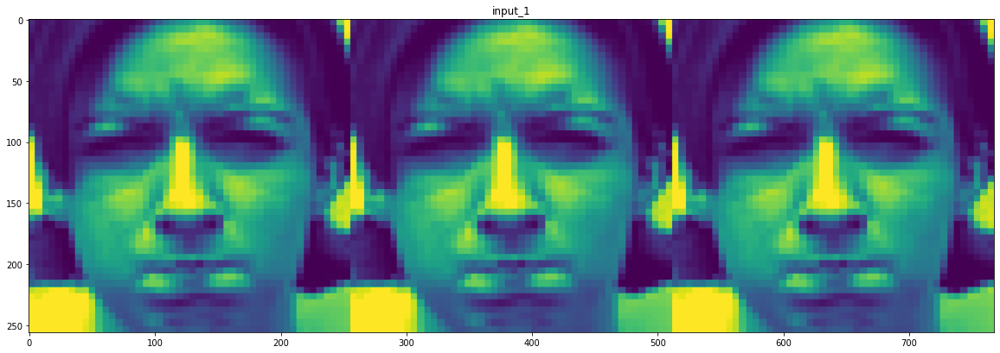

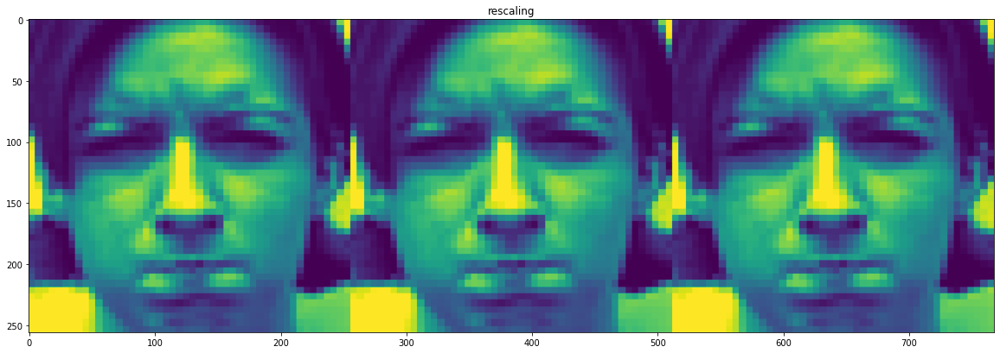

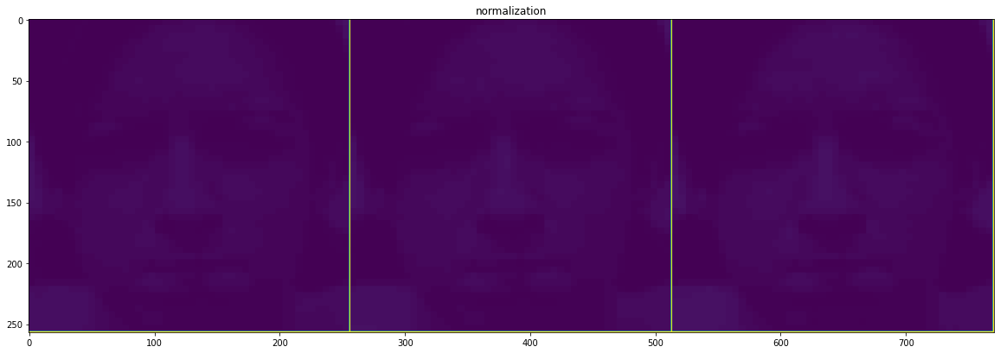

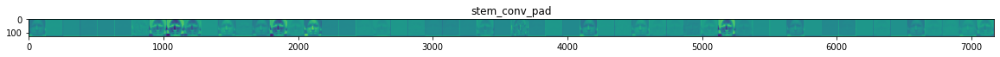

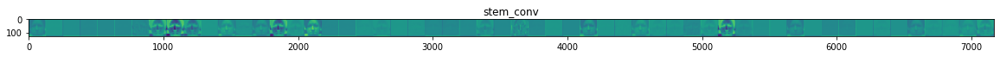

...

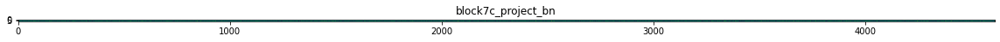

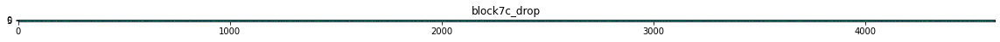

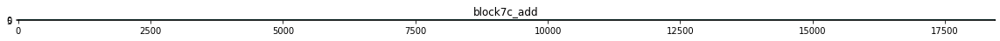

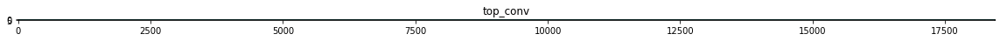

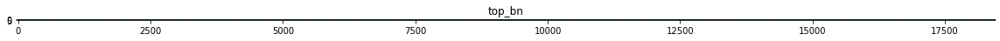

In [ ]:
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
img_path='/content/drive/MyDrive/CKPlus48/anger/S010_004_00000017.png' #dog
# img_path = X_train[0]
# Define a new Model, Input= image
# Output= intermediate representations for all layers in the
# previous model after the first.
successive_outputs = [layer.output for layer in model.layers[1:]]
#visualization_model = Model(img_input, successive_outputs)
visualization_model = tf.keras.models.Model(inputs = model.input, outputs = successive_outputs)
#Load the input image
img = image.load_img(img_path, target_size=(256, 256))
# Convert ht image to Array of dimension (150,150,3)
x   = img_to_array(img)
x   = x.reshape((1,) + x.shape)
# Rescale by 1/255
x /= 255.0
# Let's run input image through our vislauization network
# to obtain all intermediate representations for the image.
successive_feature_maps = visualization_model.predict(x)
# Retrieve are the names of the layers, so can have them as part of our plot
layer_names = [layer.name for layer in model.layers]
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  print(feature_map.shape)
  if len(feature_map.shape) == 4:

    # Plot Feature maps for the conv / maxpool layers, not the fully-connected layers

    n_features = feature_map.shape[-1]  # number of features in the feature map
    size       = feature_map.shape[ 1]  # feature map shape (1, size, size, n_features)

    # We will tile our images in this matrix
    display_grid = np.zeros((size, size * n_features))

    # Postprocess the feature to be visually palatable
    for i in range(n_features):
      x  = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std ()
      x *=  64
      x += 128
      x  = np.clip(x, 0, 255).astype('uint8')
      # Tile each filter into a horizontal grid
      display_grid[:, i * size : (i + 1) * size] = x
# Display the grid
    scale = 20. / n_features
    plt.figure( figsize=(scale * n_features, scale) )
    plt.title ( layer_name )
    plt.grid  ( False )
    plt.imshow( display_grid, aspect='auto', cmap='viridis' )

In [ ]:
#with xgboost
import xgboost
import pandas as pd
import numpy as np
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC,LinearSVC
# from sklearn.grid_search import GridSearchCV
from sklearn.model_selection import GridSearchCV
import sklearn

In [ ]:
svX_train, svX_test, svy_train, svy_test = train_test_split(df, df.emotion)

In [ ]:
svX_train.shape

(367, 3)

In [ ]:
X_train_xg = model_dense2_output.predict(X_train)
X_test_xg = model_dense2_output.predict(X_test)
print(np.array(X_train_xg).shape)
print(np.array(y_train).shape)

4/4 [==============================] - 6s 297ms/step
(352, 1024)
(352,)


In [ ]:
print(X_test.shape)
print(y_test.shape)


(98, 256, 256, 3)
(98,)


In [ ]:
z = np.concatenate([np.array(X_train_xg).reshape(352,1024),np.array(y_train).reshape(352,1)],axis=1)
z = pd.DataFrame(z)
z.to_csv('train_xg.csv',index=False)

In [ ]:
z = np.concatenate([np.array(X_test_xg).reshape(98,1024),np.array(y_test).reshape(98,1)],axis=1)
z = pd.DataFrame(z)
z.to_csv('test_xg.csv',index=False)

In [ ]:
train = pd.read_csv('train_xg.csv')
train_y = train['1024'].astype('int')
train_x = train.drop(['1024'],axis=1)
dataset = xgboost.DMatrix(train_x, label=train_y)
watchlist = [(dataset, 'train')]
params = {'max_depth':7, 'eta':0.3, 'silent':1, 'num_class':7,'objective':'multi:softmax' }
model_xg = xgboost.train(params, dataset, num_boost_round=250, evals=watchlist)


[11:33:07] WARNING: ../src/learner.cc:767: 
Parameters: { "silent" } are not used.

[0]	train-mlogloss:1.06870
[1]	train-mlogloss:0.72567
[2]	train-mlogloss:0.51513
[3]	train-mlogloss:0.37343
[4]	train-mlogloss:0.27416
[5]	train-mlogloss:0.20312
[6]	train-mlogloss:0.15162
[7]	train-mlogloss:0.11398
[8]	train-mlogloss:0.08633
[9]	train-mlogloss:0.06591
[10]	train-mlogloss:0.05079
[11]	train-mlogloss:0.03954
[12]	train-mlogloss:0.03113
[13]	train-mlogloss:0.02482
[14]	train-mlogloss:0.02005
[15]	train-mlogloss:0.01642
[16]	train-mlogloss:0.01364
[17]	train-mlogloss:0.01147
[18]	train-mlogloss:0.00978
[19]	train-mlogloss:0.00977
[20]	train-mlogloss:0.00977
[21]	train-mlogloss:0.00977
[22]	train-mlogloss:0.00977
[23]	train-mlogloss:0.00977
[24]	train-mlogloss:0.00977
[25]	train-mlogloss:0.00977
[26]	train-mlogloss:0.00977
[27]	train-mlogloss:0.00977
[28]	train-mlogloss:0.00977
[29]	train-mlogloss:0.00977
[30]	train-mlogloss:0.00977
[31]	train-mlogloss:0.00977
[32]	train-mlogloss:0.00977
[3

In [ ]:
import pandas as pd
test = pd.read_csv('test_xg.csv')
test_y = test['1024'].astype('int')
test_x = test.drop(['1024'],axis=1)

In [ ]:
test_x = xgboost.DMatrix(test_x)
result = model_xg.predict(test_x)
predicted_labels = model_xg.predict(test_x)


In [ ]:
cnf_matrix = confusion_matrix(test_y, result)
print(cnf_matrix)

[[11  0  0  3  0  0  1]
 [ 0  9  1  2  0  0  0]
 [ 0  0 10  1  0  0  0]
 [ 0  0  0  9  0  0  0]
 [ 0  0  0  0 19  0  0]
 [ 0  0  0  9  0 12  0]
 [ 0  0  0  1  0  0 10]]


In [ ]:
cm_df = pd.DataFrame(cnf_matrix, index = label_to_text,
                     columns = label_to_text
                    )
print(cm_df)
sns.heatmap(cm_df, annot = True, cmap ='Greens')
plt.savefig('exgb_kdef.jpg')

ValueError: ignored

In [ ]:
print(metrics.classification_report(test_y, result), index = label_to_text)

TypeError: ignored

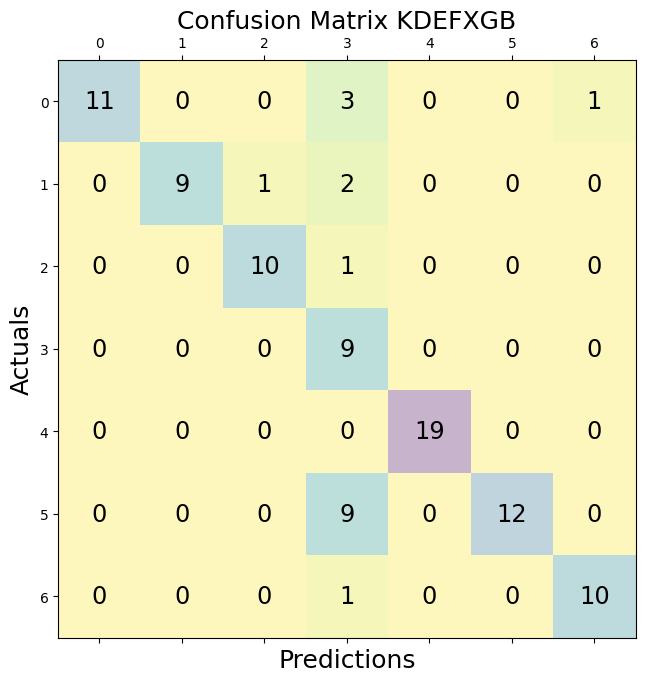

In [ ]:
fig, ax = plt.subplots(figsize=(7.5, 7.5))
ax.matshow(cnf_matrix, cmap=plt.cm.viridis_r, alpha=0.3)
for i in range(cnf_matrix.shape[0]):
    for j in range(cnf_matrix.shape[1]):
        ax.text(x=j, y=i,s=cnf_matrix[i, j], va='center', ha='center', size='xx-large')

plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix KDEFXGB', fontsize=18)
plt.show()

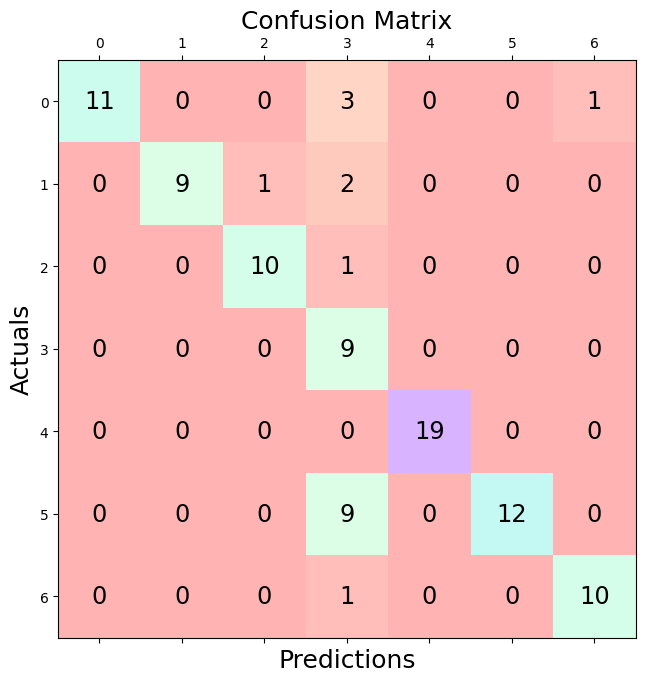

In [ ]:
fig, ax = plt.subplots(figsize=(7.5, 7.5))
ax.matshow(cnf_matrix, cmap=plt.cm.rainbow_r, alpha=0.3)
for i in range(cnf_matrix.shape[0]):
    for j in range(cnf_matrix.shape[1]):
        ax.text(x=j, y=i,s=cnf_matrix[i, j], va='center', ha='center', size='xx-large')

plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

EFFICIENTNET KDEF


ValueError: ignored

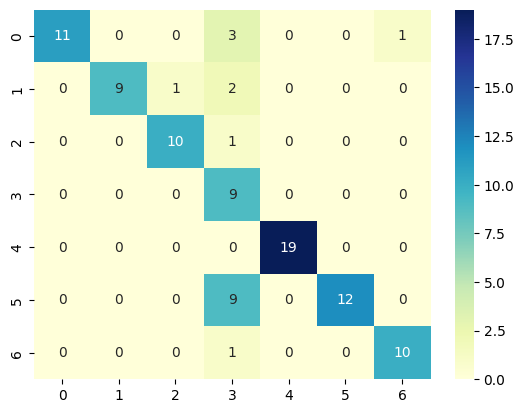

In [ ]:
label_to_text = {'Afraid','Angry', 'Disgusted','Happy', 'Neutral', 'Sad', 'Surprised'}

results = confusion_matrix(Y_test_l, Pred_l, )
import seaborn as sns

sns.heatmap(cnf_matrix, annot=True, cmap="YlGnBu")
print("EFFICIENTNET KDEF")


#Transform to df for easier plotting
cm_df = pd.DataFrame(cnf_matrix, index = label_to_text,
                     columns = label_to_text
                    )

In [ ]:
print(metrics.classification_report(test_y, result, target_names = label_to_text))
print(metrics.confusion_matrix(test_y, result))

              precision    recall  f1-score   support

         Sad       1.00      0.73      0.85        15
   Surprised       1.00      0.75      0.86        12
      Afraid       0.91      0.91      0.91        11
       Angry       0.36      1.00      0.53         9
       Happy       1.00      1.00      1.00        19
   Disgusted       1.00      0.57      0.73        21
     Neutral       0.91      0.91      0.91        11

    accuracy                           0.82        98
   macro avg       0.88      0.84      0.83        98
weighted avg       0.92      0.82      0.84        98

[[11  0  0  3  0  0  1]
 [ 0  9  1  2  0  0  0]
 [ 0  0 10  1  0  0  0]
 [ 0  0  0  9  0  0  0]
 [ 0  0  0  0 19  0  0]
 [ 0  0  0  9  0 12  0]
 [ 0  0  0  1  0  0 10]]


In [ ]:
print(metrics.classification_report(test_y, result))
print(metrics.confusion_matrix(test_y, result))

              precision    recall  f1-score   support

           0       1.00      0.73      0.85        15
           1       1.00      0.75      0.86        12
           2       0.91      0.91      0.91        11
           3       0.36      1.00      0.53         9
           4       1.00      1.00      1.00        19
           5       1.00      0.57      0.73        21
           6       0.91      0.91      0.91        11

    accuracy                           0.82        98
   macro avg       0.88      0.84      0.83        98
weighted avg       0.92      0.82      0.84        98

[[11  0  0  3  0  0  1]
 [ 0  9  1  2  0  0  0]
 [ 0  0 10  1  0  0  0]
 [ 0  0  0  9  0  0  0]
 [ 0  0  0  0 19  0  0]
 [ 0  0  0  9  0 12  0]
 [ 0  0  0  1  0  0 10]]


**ROC**

In [ ]:
from sklearn.metrics import roc_curve,auc
from itertools import cycle

In [ ]:
new_label = ['anger','contempt','disgust','fear','happy','sadness','surprise']
final_label = new_label
new_class = 7

In [ ]:
#ravel flatten the array into single vector
y_pred = test_y
y_pred_ravel = y_pred.ravel()
lw = 2

In [ ]:
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(new_class):
    fpr[i], tpr[i], _ = roc_curve(y_test[:,i], y_pred[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])

#colors = cycle(['red', 'green','black'])
colors = cycle(['red', 'green','black','blue', 'yellow','purple','orange'])
for i, color in zip(range(new_class), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0}'''.format(final_label[i]))


plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

IndexError: ignored

FROM IEEE ACCESS PAPER GITHUB LINK